https://huggingface.co/blog/annotated-diffusion

In [2]:
!pip install -q -U einops datasets matplotlib tqdm opencv-python

import math
from inspect import isfunction
from functools import partial

%matplotlib inline
import matplotlib.pyplot as plt
from tqdm.auto import tqdm
from einops import rearrange, reduce
from einops.layers.torch import Rearrange

import torch
from torch import nn, einsum
import torch.nn.functional as F



[notice] A new release of pip available: 22.2.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


Lets try simulating forward diffusion step by step, then at different t's

In [3]:
import cv2
import numpy as np
# Load an image
img = cv2.imread('data/pup.jpeg')

# Convert BGR to RGB
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Resize for simplicity
img = cv2.resize(img, (254, 254))

# scale to [-1,1]
x0 = img.astype(np.float32) / 127.5 - 1.0   # → [-1, 1]

In [4]:
import numpy as np

def rescale(img: np.ndarray) -> np.ndarray:
    img = img.astype(np.float32)
    if img.min() < 0:
        img = (img + 1.0) / 2.0
    img_uint8 = np.clip(img * 255.0, 0, 255).astype(np.uint8)
    return img_uint8

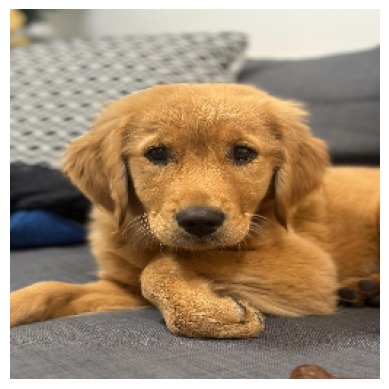

In [5]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Display inline
plt.imshow(rescale(x0)) #rescale before plotting
plt.axis('off')  # hides axes for a cleaner view
plt.show()

we have image of size (254*254) in RGB. Let's try to diffuse this step by step and see how it affects the image.

 q(xt|xt−1) := Normal (xt;sqrt(1 − βt.xt−1), βt.I)

 xt = sqrt(1-βt).xt-1 + sqrt(βt).ε

 x1 = sqrt(1-β1).x0 + sqrt(β1).ε

In [6]:
#adding noise to one step
#sample random noise

beta = 0.02  # try values like 0.01–0.1

noise = np.random.randn(*x0.shape).astype(np.float32)

x1 = np.sqrt(1 - beta) * x0 + np.sqrt(beta) * noise


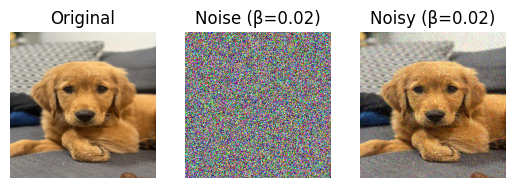

In [7]:
plt.subplot(1,3,1)
plt.imshow(rescale(x0))
plt.title("Original")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(rescale(noise))
plt.title(f"Noise (β={beta})")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(rescale(x1))
plt.title(f"Noisy (β={beta})")
plt.axis('off')

plt.show()


GPT code to plot with different noise levels, 


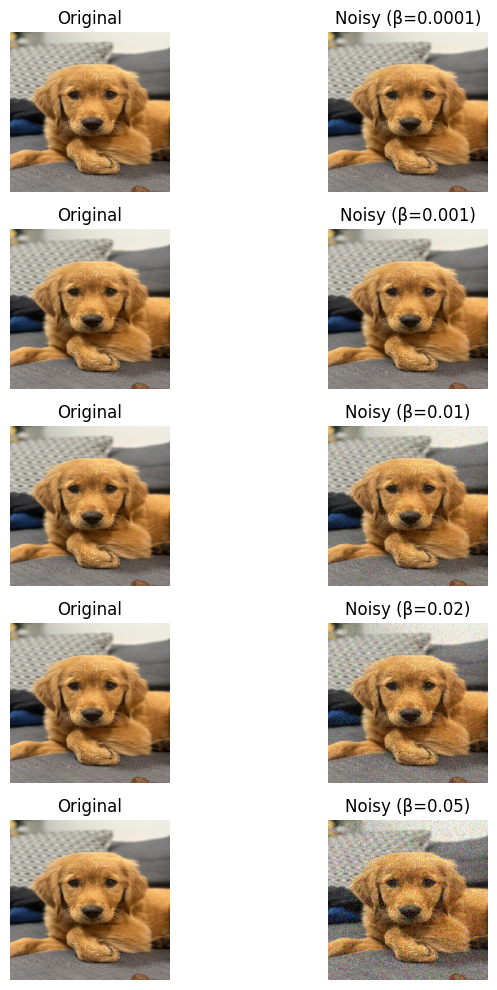

In [8]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


# Define noise levels, in paper they have schedule from 1e-4 to 0.02
betas = [1e-4, 1e-3, 1e-2, 0.02, 0.05]

# Create subplot grid
rows = len(betas)
cols = 2
plt.figure(figsize=(8, 2 * rows))

for i, beta in enumerate(betas):
    noise = np.random.randn(*x0.shape).astype(np.float32)
    x1 = np.sqrt(1 - beta) * x0 + np.sqrt(beta) * noise

    # Original
    plt.subplot(rows, cols, i * cols + 1)
    plt.imshow(rescale(x0))
    plt.title("Original")
    plt.axis("off")

    # Noisy version
    plt.subplot(rows, cols, i * cols + 2)
    plt.imshow(rescale(x1))
    plt.title(f"Noisy (β={beta})")
    plt.axis("off")

plt.tight_layout()
plt.show()


we can see how for lower noise levels we find it hard to distinguish between normal and noisy ones, and it get's more noticable as we increase noise level. Let's try to understand what is actually happening.

In [9]:
x0.shape

(254, 254, 3)

In [10]:
254*254*3

193548

In [11]:

beta = 0.02  # try values like 0.01–0.1, noise level

noise = np.random.randn(*x0.shape).astype(np.float32) #so here we are basically generating noise matrix the size of x0. 254*254*3 = 193548

x1 = np.sqrt(1 - beta) * x0 + np.sqrt(beta) * noise

Generates samples from a standard normal distribution:

𝜖∼𝑁(0,1)

normal distrubution with
mean = 0
standard deviation = 1 

meaning, 
Most samples (≈ 68%) fall within ±1 of 0.
About 95% fall within ±2.

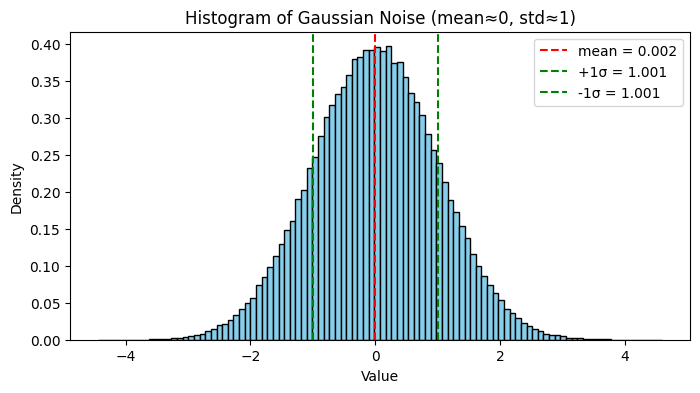

In [12]:
#Flatten to 1D for histogram
flat_noise = noise.flatten()

# Plot histogram
plt.figure(figsize=(8,4))
plt.hist(flat_noise, bins=100, density=True, color='skyblue', edgecolor='black')
plt.title("Histogram of Gaussian Noise (mean≈0, std≈1)")
plt.xlabel("Value")
plt.ylabel("Density")

# Show mean and std for confirmation
mean, std = np.mean(flat_noise), np.std(flat_noise)
plt.axvline(mean, color='red', linestyle='--', label=f"mean = {mean:.3f}")
plt.axvline(mean + std, color='green', linestyle='--', label=f"+1σ = {std:.3f}")
plt.axvline(mean - std, color='green', linestyle='--', label=f"-1σ = {std:.3f}")
plt.legend()
plt.show()


we can see the values samples from N(0,1) forms this histogram, we will also try for image

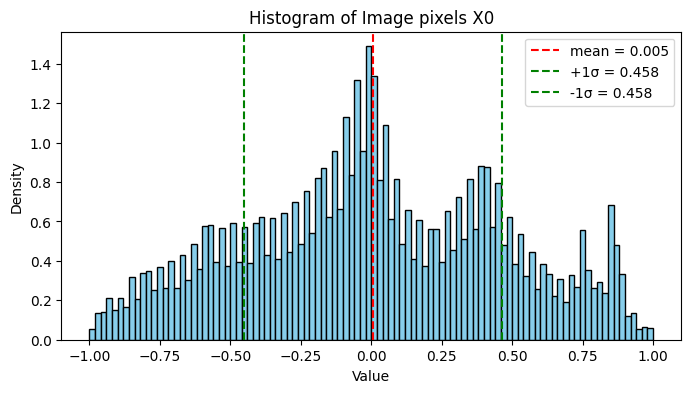

In [13]:
#Flatten to 1D for histogram
flat_noise = x0.flatten()

# Plot histogram
plt.figure(figsize=(8,4))
plt.hist(flat_noise, bins=100, density=True, color='skyblue', edgecolor='black')
plt.title("Histogram of Image pixels X0")
plt.xlabel("Value")
plt.ylabel("Density")

# Show mean and std for confirmation
mean, std = np.mean(flat_noise), np.std(flat_noise)
plt.axvline(mean, color='red', linestyle='--', label=f"mean = {mean:.3f}")
plt.axvline(mean + std, color='green', linestyle='--', label=f"+1σ = {std:.3f}")
plt.axvline(mean - std, color='green', linestyle='--', label=f"-1σ = {std:.3f}")
plt.legend()
plt.show()


the x0 matrix has values majorly around 0. (remember that the image was initially scaled to fit between -1 and 1)

X1 is just X0 + some noise generated from sampling a standard noraml guassian distribution. Let's try to understand this in terms of conditional probability.

193548(254*254*3), each pixel is modified by adding some noise (val close to 0, mostly +1 or -1)

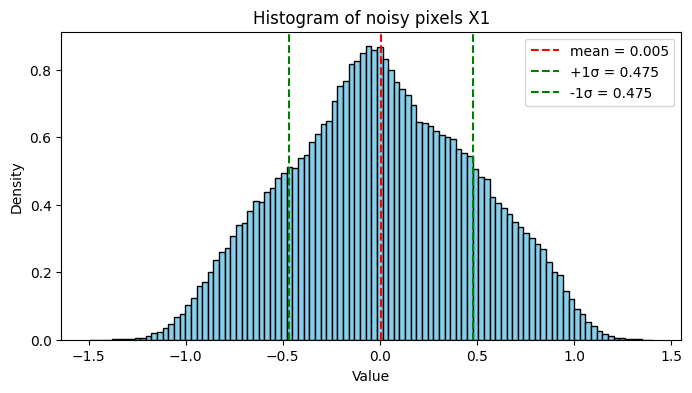

In [14]:
#Flatten to 1D for histogram
flat_noise = x1.flatten()

# Plot histogram
plt.figure(figsize=(8,4))
plt.hist(flat_noise, bins=100, density=True, color='skyblue', edgecolor='black')
plt.title("Histogram of noisy pixels X1")
plt.xlabel("Value")
plt.ylabel("Density")

# Show mean and std for confirmation
mean, std = np.mean(flat_noise), np.std(flat_noise)
plt.axvline(mean, color='red', linestyle='--', label=f"mean = {mean:.3f}")
plt.axvline(mean + std, color='green', linestyle='--', label=f"+1σ = {std:.3f}")
plt.axvline(mean - std, color='green', linestyle='--', label=f"-1σ = {std:.3f}")
plt.legend()
plt.show()


each pixel in X0 is modified to any level by noise. Noise is sampled from a normal distribution. So, each pixel can be modified in number of values/ways. Each of it forms a distribution. X1 is a sample from that distribution. 

How GPT summarised it: 
"Each pixel in X0 is independently perturbed by Gaussian noise sampled from a normal distribution, so the resulting pixel value X1 is a sample from a conditional Gaussian distribution centered at 1−𝛽.𝑥0 with variance 𝛽"

Now let's try to diffuse the image for 1000 steps (as in ddpm paper) with noise level schedule to see how it affects images.

noise level schedule

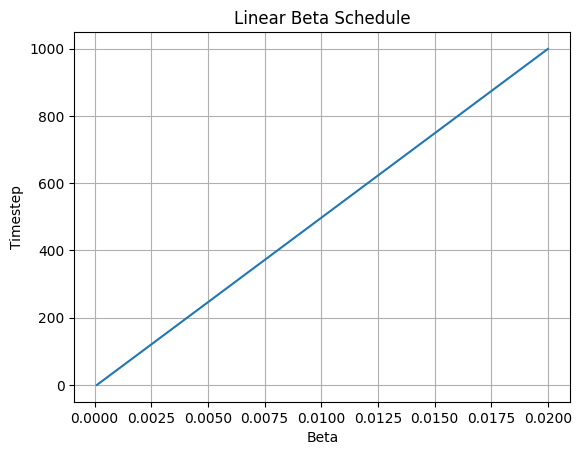

In [15]:
import numpy as np

T = 1000
betas = np.linspace(1e-4, 0.02, T, dtype=np.float32)
plt.plot(betas, range(T))
plt.ylabel("Timestep")
plt.xlabel("Beta")
plt.title("Linear Beta Schedule")
plt.grid(True)
plt.show()

using this betas, let's apply diffusion to x0 iteratively for 1000 timesteps. plt for every 10 steps, so we can 100 images.

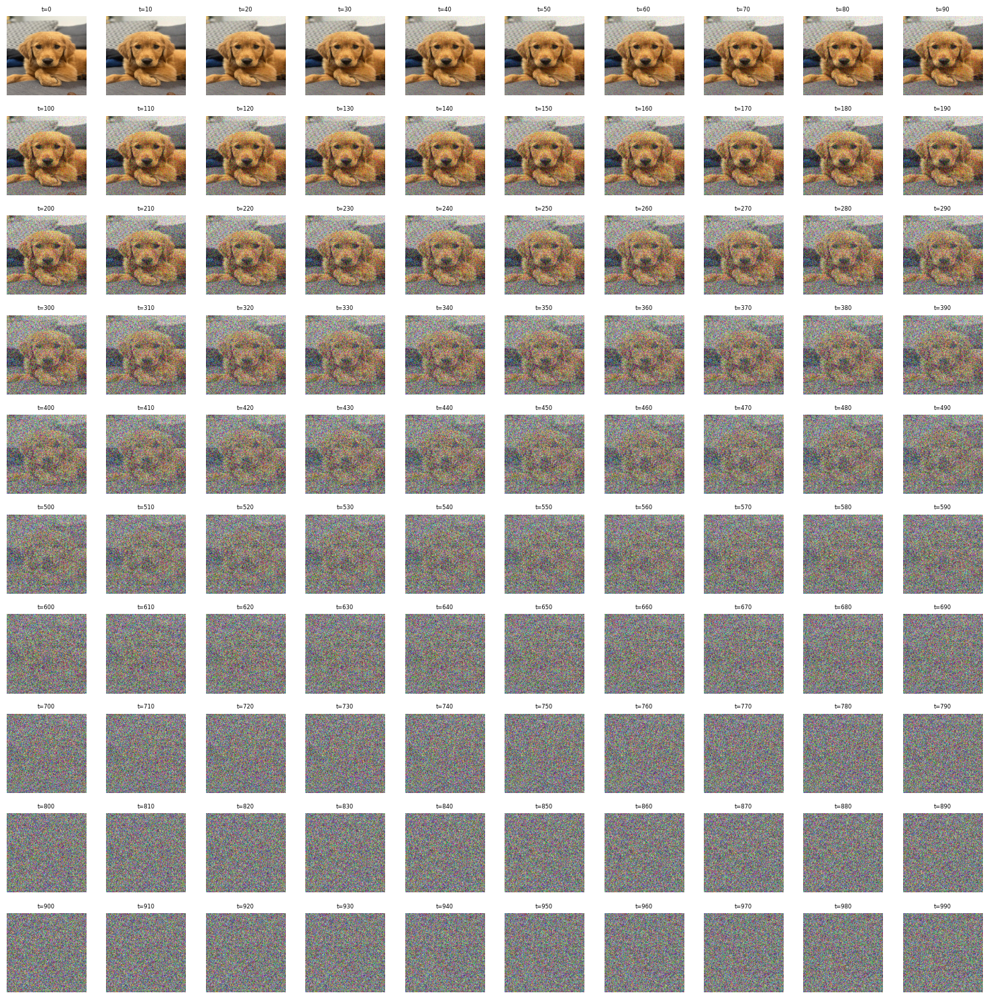

In [16]:
T = 1000
# betas = np.linspace(1e-4, 0.02, T, dtype=np.float32)
xt = x0.copy()

def diffuse(xtminus1, beta):
    noise = np.random.randn(*xtminus1.shape).astype(np.float32)
    xt = np.sqrt(1-beta)*xtminus1 + np.sqrt(beta)*noise
    return xt 

frames = []
for t in range(T):
    xt = diffuse(xt,betas[t])
    if t % 10 == 0:
        frames.append((t, xt.copy()))

# Plot every 10 steps (100 images)
plt.figure(figsize=(15, 15))
for i, (t, frame) in enumerate(frames, start=1):
    plt.subplot(10, 10, i)
    plt.imshow(rescale(frame))
    plt.axis('off')
    plt.title(f"t={t}", fontsize=6)
plt.tight_layout()
plt.show()

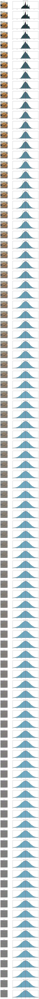

In [25]:
# Plot: one row per frame (image + histogram)


batch_size = 100
for start in range(0, len(frames), batch_size):
    subset = frames[start:start + batch_size]
    rows = len(subset)
    plt.figure(figsize=(10, 2 * rows))

    for i, (t, frame) in enumerate(subset):
        flat = frame.flatten()
        mean, std = np.mean(flat), np.std(flat)

        # Image
        plt.subplot(rows, 2, 2*i + 1)
        plt.imshow(rescale(frame))
        plt.axis('off')
        plt.title(f"t={t}", fontsize=8)

        # Histogram
        plt.subplot(rows, 2, 2*i + 2)
        plt.hist(flat, bins=100, density=True, color='skyblue', edgecolor='black')
        plt.axvline(mean, color='red', linestyle='--')
        plt.axvline(mean + std, color='green', linestyle='--')
        plt.axvline(mean - std, color='green', linestyle='--')
        plt.title(f"mean={mean:.2f}, std={std:.2f}", fontsize=7)
        plt.xlim(-3, 3)
        plt.yticks([])

    plt.tight_layout()
    plt.show()

we can see how the cummulative pixel density of the image is getting nudged to form gaussian normal distrubtion, and image turns to gaussian noise. This is diffusion, and it kind of mimics langevin dynamics(some similar theory and formulation in physics for actual diffusion)

Let's check cummulative distribution of final XT,  X at t=1000

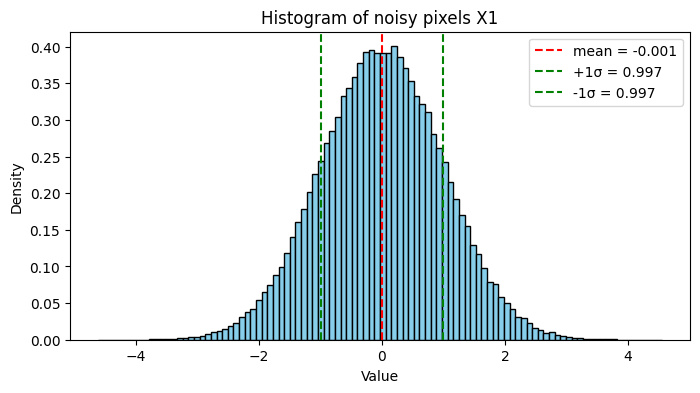

In [18]:
#Flatten to 1D for histogram
flat_noise = xt.flatten()

# Plot histogram
plt.figure(figsize=(8,4))
plt.hist(flat_noise, bins=100, density=True, color='skyblue', edgecolor='black')
plt.title("Histogram of noisy pixels X1")
plt.xlabel("Value")
plt.ylabel("Density")

# Show mean and std for confirmation
mean, std = np.mean(flat_noise), np.std(flat_noise)
plt.axvline(mean, color='red', linestyle='--', label=f"mean = {mean:.3f}")
plt.axvline(mean + std, color='green', linestyle='--', label=f"+1σ = {std:.3f}")
plt.axvline(mean - std, color='green', linestyle='--', label=f"-1σ = {std:.3f}")
plt.legend()
plt.show()


We can see that distrubution of cummulative pixel values is close to a standard normal distribution, from which we sampled our noise.

Now let's try to see the reparametrization, trick. Because it is used to train diffusion models.

q(xt∣xt−1) is still a normal distribution. The final key detail we have to know about the forward process is that because the distributions are normal, we can mathematically derive a distribution known as the “Diffusion Kernel” which is the distribution of any intermediate value in our forward process given our initial data point. This allows us to bypass all of the intermediate steps of iteratively adding t-1 levels of noise in the forward process to get an image with t noise which will come in handy later when we train our model. 

meaning, x1 is gaussian since x0+gaussian noise is gaussian. So is x2, x3,..XT. Because a linear combination of Gaussian variables is still Gaussian.

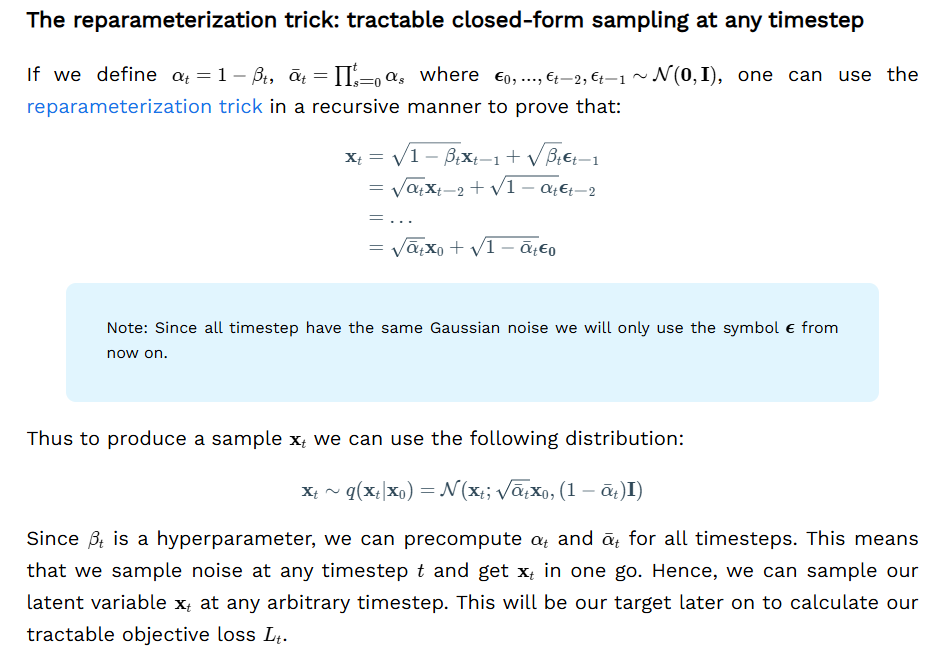

For now let's try this and validate for some t. Let try for t=512. 

In [26]:
# Define diffusion schedule
T = 1000
betas = np.linspace(1e-4, 0.02, T, dtype=np.float32)
alphas = 1.0 - betas
alpha_bar = np.cumprod(alphas)  # cumulative product

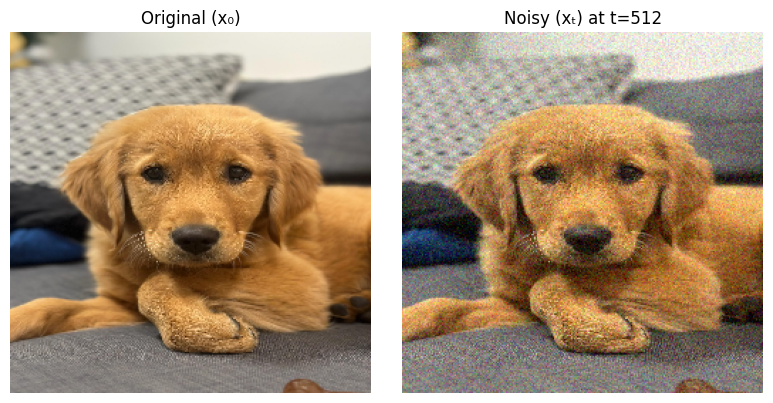

ᾱ[512] = 0.068800


In [29]:
t = 512
noise = np.random.randn(*x0.shape).astype(np.float32)

# Apply diffusion kernel formula
xt = np.sqrt(alpha_bar[t]) * x0 + np.sqrt(1 - alpha_bar[t]) * noise

# Display
plt.figure(figsize=(8,4))
plt.subplot(1,2,1)
plt.imshow(rescale(x0))
plt.axis('off')
plt.title("Original (x₀)")

plt.subplot(1,2,2)
plt.imshow(rescale(x1))
plt.axis('off')
plt.title(f"Noisy (xₜ) at t={t}")

plt.tight_layout()
plt.show()

# Print stats
print(f"ᾱ[{t}] = {alpha_bar[t]:.6f}")

In this we can get Xt at random t, directly from X0, in single step. We will be using this Diffusion Kernel trick for training.